<a href="https://colab.research.google.com/github/Roselia-penguin/Math3790_FinalProject-VQASystem/blob/main/math3790_MobileNetV2%26BERT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
!pip install gdown

In [ ]:
!gdown --id 1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67
# uncomment if ur in colab

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67
From (redirected): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67&confirm=t&uuid=cae18dcc-bf8c-4dac-8b66-8d7166995002
To: /content/VQA.zip
100% 431M/431M [00:18<00:00, 23.7MB/s]


In [ ]:
!unzip /content/VQA.zip
# uncomment if ur in colab

Archive:  /content/VQA.zip
  inflating: dataset/all_qa_pairs.txt  
  inflating: dataset/answer_space.txt  
  inflating: dataset/data.csv        
  inflating: dataset/data_eval.csv   
  inflating: dataset/data_train.csv  
  inflating: dataset/images/image1.png  
  inflating: dataset/images/image10.png  
  inflating: dataset/images/image100.png  
  inflating: dataset/images/image1000.png  
  inflating: dataset/images/image1001.png  
  inflating: dataset/images/image1002.png  
  inflating: dataset/images/image1003.png  
  inflating: dataset/images/image1004.png  
  inflating: dataset/images/image1005.png  
  inflating: dataset/images/image1006.png  
  inflating: dataset/images/image1007.png  
  inflating: dataset/images/image1008.png  
  inflating: dataset/images/image1009.png  
  inflating: dataset/images/image101.png  
  inflating: dataset/images/image1010.png  
  inflating: dataset/images/image1011.png  
  inflating: dataset/images/image1012.png  
  inflating: dataset/images/image1013.

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 21.6 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import os
from datasets import load_dataset
from transformers import BertTokenizer
class VQADataset(Dataset):
    def __init__(self, csv_file, image_folder, transform=None):
        # Load dataset from CSV
        self.data = pd.read_csv(csv_file)
        self.image_folder = image_folder
        self.transform = transform
        # Initialize the tokenizer
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        # Preprocess the dataset
        self.preprocess_dataset()

    def preprocess_dataset(self):
        # Load the dataset using the provided logic
        dataset = load_dataset(
            "csv",
            data_files={
                "train": os.path.join("/content/dataset", "data_train.csv"),
                "test": os.path.join("/content/dataset", "data_eval.csv")
            }
        )

        with open(os.path.join("/content/dataset/", "answer_space.txt")) as f:
            answer_space = f.read().splitlines()

        self.data = dataset.map(
            lambda examples: {
                'label': [
                    answer_space.index(ans.replace(" ", "").split(",")[0])  # Select the 1st answer if multiple answers are provided
                    for ans in examples['answer']
                ]
            },
            batched=True
        )

        # Convert dataset to DataFrame for easy indexing
        self.data = pd.DataFrame(self.data['train'])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        image_id = row['image_id']
        question = row['question']
        label = row['label']

        image_path = os.path.join(self.image_folder, f"{image_id}.png")
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        # Tokenize the question
        inputs = self.tokenizer(question, return_tensors='pt', padding='max_length', truncation=True, max_length=512)
        # Ensure the tensors are in the correct format for the DataLoader
        input_ids = inputs['input_ids'].squeeze(0)  # Remove batch dimension
        attention_mask = inputs['attention_mask'].squeeze(0)  # Remove batch dimension

        return image, input_ids, attention_mask, label

In [ ]:
# Example usage:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 更新文件路径
train_csv_path = '/content/dataset/data_train.csv'
train_images_folder = '/content/dataset/images'
val_csv_path = '/content/dataset/data_eval.csv'

# 创建数据集和数据加载器
train_dataset = VQADataset(train_csv_path, train_images_folder, transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)

val_dataset = VQADataset(val_csv_path, train_images_folder, transform)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/9974 [00:00<?, ? examples/s]

Map:   0%|          | 0/2494 [00:00<?, ? examples/s]

In [ ]:
import torch
import torch.nn as nn
from transformers import BertModel
from torchvision import models
from torch.cuda.amp import autocast, GradScaler
from torch.utils.checkpoint import checkpoint
from tqdm import tqdm
import matplotlib.pyplot as plt
import json

class VQAModel(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel, self).__init__()
        # Image feature extractor
        self.cnn = models.mobilenet_v2(pretrained=True)
        self.cnn.classifier = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(1280 + 768, 1024)  # Correct the input dimension
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = self.cnn(images)
        image_features = image_features.view(image_features.size(0), -1)  # Flatten image features

        # Extract question features
        outputs = self.bert(input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


**Training**

In [ ]:
import torch.optim as optim
from torch.nn import CrossEntropyLoss

# Initialize the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel(num_answers=582)
model.to(device)

# Initialize the optimizer and GradScaler for mixed precision training
optimizer = optim.Adam(model.parameters(), lr=0.001)
scaler = GradScaler()

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Initialize metrics storage
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training parameters
num_epochs = 30
best_loss = float('inf')
best_model_state = None
patience = 4  # Number of epochs to wait for improvement before stopping
early_stopping_counter = 0

In [ ]:
def calculate_accuracy(outputs, labels):
    _, preds = torch.max(outputs, 1)
    correct = (preds == labels).sum().item()
    total = labels.size(0)
    return correct / total

In [ ]:
import torch
import json
from tqdm import tqdm

# 定义训练循环
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch")

    for images, input_ids, attention_mask, labels in progress_bar:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images, input_ids, attention_mask)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        accuracy = calculate_accuracy(outputs, labels)
        running_accuracy += accuracy

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = running_accuracy / len(train_loader)

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    model.eval()
    val_running_loss = 0.0
    val_running_accuracy = 0.0

    with torch.no_grad():
        val_progress_bar = tqdm(val_loader, desc="Validating", unit="batch")
        for images, input_ids, attention_mask, labels in val_progress_bar:
            images = images.to(device)
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            labels = labels.to(device)

            with torch.cuda.amp.autocast():
                outputs = model(images, input_ids, attention_mask)
                loss = criterion(outputs, labels)

            val_running_loss += loss.item()
            accuracy = calculate_accuracy(outputs, labels)
            val_running_accuracy += accuracy

    val_loss = val_running_loss / len(val_loader)
    val_accuracy = val_running_accuracy / len(val_loader)

    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss}, Training Accuracy: {epoch_accuracy}")
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Check if the validation loss improved
    if val_loss < best_loss:
        best_loss = val_loss
        best_model_state = model.state_dict()
        early_stopping_counter = 0  # Reset counter if we get a new best loss
        print(f"Saving model with lowest validation loss: {best_loss:.4f}")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler_state_dict': scaler.state_dict(),
            'best_loss': best_loss,
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_accuracies': train_accuracies,
            'val_accuracies': val_accuracies
        }, "/content/best_model.pth")
    else:
        early_stopping_counter += 1
        print(f"No improvement in validation loss for {early_stopping_counter} epochs.")

    # Check for early stopping
    if early_stopping_counter >= patience:
        print("Early stopping triggered.")
        break

# Save the final metrics
metrics = {
    "train_losses": train_losses,
    "val_losses": val_losses,
    "train_accuracies": train_accuracies,
    "val_accuracies": val_accuracies
}

with open("/content/training_metrics.json", "w") as f:
    json.dump(metrics, f)


Validating: 100%|██████████| 156/156 [00:45<00:00,  3.45batch/s]


Epoch 1/30, Training Loss: 5.2007700602213545, Training Accuracy: 0.033991423314339984
Validation Loss: 4.840919283720163, Validation Accuracy: 0.04408164173789174
Saving model with lowest validation loss: 4.8409


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 2/30, Training Loss: 4.874442650721623, Training Accuracy: 0.04382567663817664
Validation Loss: 4.716191857289045, Validation Accuracy: 0.05506217355175689
Saving model with lowest validation loss: 4.7162


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 3/30, Training Loss: 4.754521605296013, Training Accuracy: 0.0518014007597341
Validation Loss: 4.584162400319026, Validation Accuracy: 0.06089001661918329
Saving model with lowest validation loss: 4.5842


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 4/30, Training Loss: 4.671286427057707, Training Accuracy: 0.053585737179487176
Validation Loss: 4.530372359813788, Validation Accuracy: 0.05604522792022792
Saving model with lowest validation loss: 4.5304


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.36batch/s]


Epoch 5/30, Training Loss: 4.601561078658471, Training Accuracy: 0.05761069563152897
Validation Loss: 4.467828493851882, Validation Accuracy: 0.06962250712250712
Saving model with lowest validation loss: 4.4678


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 6/30, Training Loss: 4.60276598808093, Training Accuracy: 0.0552624940645774
Validation Loss: 4.391865806701856, Validation Accuracy: 0.07060556149097816
Saving model with lowest validation loss: 4.3919


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 7/30, Training Loss: 4.5198920873495245, Training Accuracy: 0.06067114791073125
Validation Loss: 4.360635555707491, Validation Accuracy: 0.07481229226020893
Saving model with lowest validation loss: 4.3606


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 8/30, Training Loss: 4.463455542539939, Training Accuracy: 0.06351273148148148
Validation Loss: 4.282882870771946, Validation Accuracy: 0.07509422483380816
Saving model with lowest validation loss: 4.2829


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]


Epoch 9/30, Training Loss: 4.415066514259729, Training Accuracy: 0.0682647792022792
Validation Loss: 4.300377164131556, Validation Accuracy: 0.07829193376068376
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 10/30, Training Loss: 4.387032001446455, Training Accuracy: 0.0707687856125356
Validation Loss: 4.188469088994539, Validation Accuracy: 0.08597459639126305
Saving model with lowest validation loss: 4.1885


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 11/30, Training Loss: 4.394160191218059, Training Accuracy: 0.07197070868945869
Validation Loss: 4.773802686960269, Validation Accuracy: 0.0513562440645774
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 12/30, Training Loss: 4.368757153168703, Training Accuracy: 0.07010476020892688
Validation Loss: 4.104860235483218, Validation Accuracy: 0.09402451329534663
Saving model with lowest validation loss: 4.1049


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 13/30, Training Loss: 4.26986559232076, Training Accuracy: 0.07789871201329535
Validation Loss: 4.026201746402642, Validation Accuracy: 0.10100976377018044
Saving model with lowest validation loss: 4.0262


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]


Epoch 14/30, Training Loss: 4.232364119627537, Training Accuracy: 0.08226866690408356
Validation Loss: 4.032292544841766, Validation Accuracy: 0.09770447530864199
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]


Epoch 15/30, Training Loss: 4.194004807716761, Training Accuracy: 0.08098513176638177
Validation Loss: 3.966997294853895, Validation Accuracy: 0.10774646842355175
Saving model with lowest validation loss: 3.9670


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 16/30, Training Loss: 4.159622207666055, Training Accuracy: 0.08460944919278253
Validation Loss: 3.969388506351373, Validation Accuracy: 0.10525359093067428
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 17/30, Training Loss: 4.108466594647139, Training Accuracy: 0.09190259971509972
Validation Loss: 3.8585762289854197, Validation Accuracy: 0.12050391737891737
Saving model with lowest validation loss: 3.8586


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 18/30, Training Loss: 4.083327889442444, Training Accuracy: 0.09222162867996202
Validation Loss: 3.803423965588594, Validation Accuracy: 0.1274335232668566
Saving model with lowest validation loss: 3.8034


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 19/30, Training Loss: 4.0473778920295915, Training Accuracy: 0.09474418328584996
Validation Loss: 3.778636327156654, Validation Accuracy: 0.1252745132953466
Saving model with lowest validation loss: 3.7786


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 20/30, Training Loss: 4.000518888999254, Training Accuracy: 0.10056460707502375
Validation Loss: 3.7702734027153406, Validation Accuracy: 0.1265506291547958
Saving model with lowest validation loss: 3.7703


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 21/30, Training Loss: 3.9742070940824656, Training Accuracy: 0.10411473171889839
Validation Loss: 3.7108639432833743, Validation Accuracy: 0.1309391322412156
Saving model with lowest validation loss: 3.7109


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 22/30, Training Loss: 3.9378575606223865, Training Accuracy: 0.10702679843304844
Validation Loss: 3.6781621819887405, Validation Accuracy: 0.13533876424501423
Saving model with lowest validation loss: 3.6782


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 23/30, Training Loss: 3.892983155372815, Training Accuracy: 0.10908564814814814
Validation Loss: 3.6820872746981106, Validation Accuracy: 0.13932662630579296
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 24/30, Training Loss: 3.8567504164500113, Training Accuracy: 0.11152659069325736
Validation Loss: 3.652992641314482, Validation Accuracy: 0.14295836301044634
Saving model with lowest validation loss: 3.6530


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 25/30, Training Loss: 3.8392482766738305, Training Accuracy: 0.11373011633428301
Validation Loss: 3.5366549476599083, Validation Accuracy: 0.14628219966761632
Saving model with lowest validation loss: 3.5367


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]


Epoch 26/30, Training Loss: 3.8077489718412743, Training Accuracy: 0.1166162155745489
Validation Loss: 3.5097523087110276, Validation Accuracy: 0.15523355887939222
Saving model with lowest validation loss: 3.5098


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 27/30, Training Loss: 3.7946215134400587, Training Accuracy: 0.11545880816714149
Validation Loss: 3.5471041171978683, Validation Accuracy: 0.14357787274453943
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.37batch/s]


Epoch 28/30, Training Loss: 3.763327094224783, Training Accuracy: 0.11584090099715101
Validation Loss: 3.439988139348152, Validation Accuracy: 0.1626454178537512
Saving model with lowest validation loss: 3.4400


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]


Epoch 29/30, Training Loss: 3.723636052547357, Training Accuracy: 0.12342711301044634
Validation Loss: 3.4003931482632956, Validation Accuracy: 0.15913980887939222
Saving model with lowest validation loss: 3.4004


Validating: 100%|██████████| 156/156 [00:46<00:00,  3.38batch/s]

Epoch 30/30, Training Loss: 3.7020486501547007, Training Accuracy: 0.12006617996201328
Validation Loss: 3.402643796725151, Validation Accuracy: 0.15821981837606838
No improvement in validation loss for 1 epochs.


**Plotting**

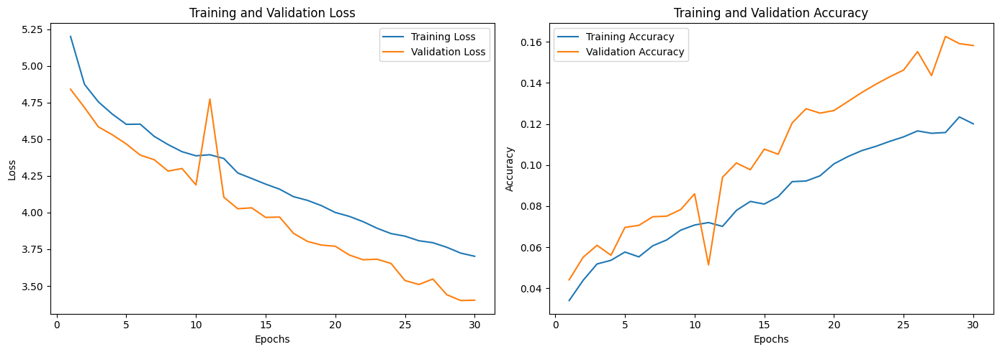

In [ ]:
import json
import matplotlib.pyplot as plt

# Load the saved metrics from Colab's local storage
with open("/content/training_metrics.json", "r") as f:
    metrics = json.load(f)

train_losses = metrics["train_losses"]
val_losses = metrics["val_losses"]
train_accuracies = metrics["train_accuracies"]
val_accuracies = metrics["val_accuracies"]

# Plot the metrics
epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Training Accuracy')
plt.plot(epochs, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.tight_layout()
plt.show()


In [ ]:
class VQAModel1(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel1, self).__init__()
        # Image feature extractor
        self.cnn = models.mobilenet_v2(pretrained=True)
        self.cnn.classifier = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(1280 + 768, 1024)  # Correct the input dimension
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = self.cnn(images)
        image_features = image_features.view(image_features.size(0), -1)  # Flatten image features

        # Extract question features
        outputs = self.bert(input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [ ]:
# Initialize the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel1(num_answers=582)  # Adjust num_answers based on your dataset
model.to(device)

# Load the best model checkpoint
checkpoint_path = "/content/best_model.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint['model_state_dict'])

print("Best model loaded successfully.")

Best model loaded successfully.


In [ ]:
from torch.utils.data import DataLoader
from torchvision import transforms

# Example usage
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = VQADataset('/content/dataset/data_eval.csv', '/content/dataset/images', transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

print("Test data loader prepared successfully.")

Test data loader prepared successfully.


In [ ]:
!pip install sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 5.3 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sentence_transformers import SentenceTransformer, util

# Load Sentence-BERT model
model_sbert = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Function to calculate similarity using Sentence-BERT
def sbert_similarity(sentence1, sentence2):
    embeddings1 = model_sbert.encode(sentence1, convert_to_tensor=True)
    embeddings2 = model_sbert.encode(sentence2, convert_to_tensor=True)
    cosine_scores = util.pytorch_cos_sim(embeddings1, embeddings2)
    return cosine_scores.item()

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
def preprocess_answer(answer):
    # Remove underscores from the answer
    return answer.replace('_', ' ')

In [ ]:
import os
import torch
import torch.nn as nn

# Load answer space for mapping
with open(os.path.join("/content/dataset", "answer_space.txt")) as f:
    answer_space = f.read().splitlines()

# Assuming the model has been defined earlier
model.eval()
test_losses = []
test_accuracies = []
similarities = []

# Assuming criterion has been defined earlier
criterion = nn.CrossEntropyLoss()


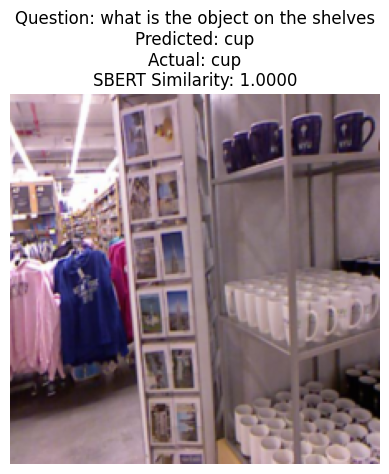

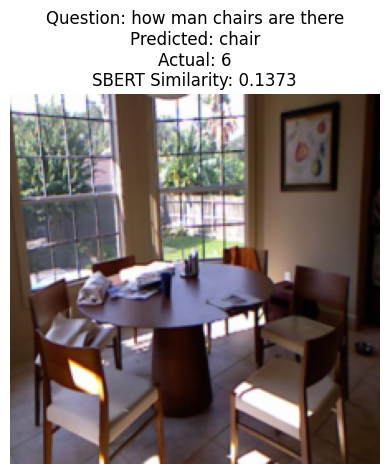

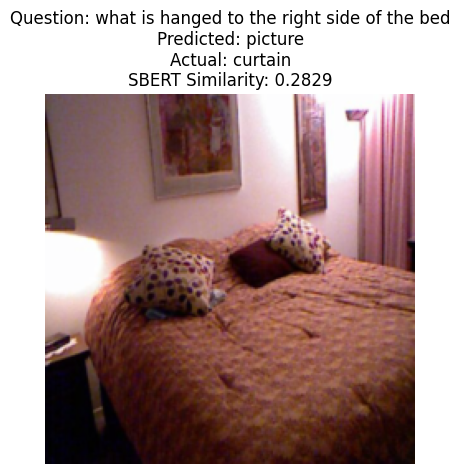

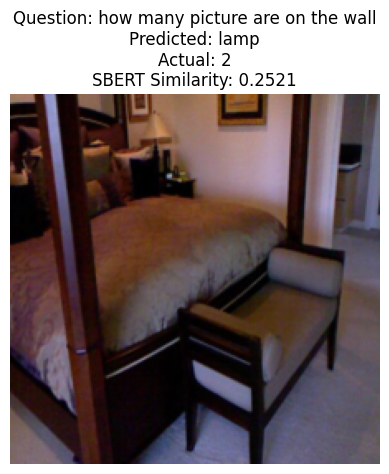

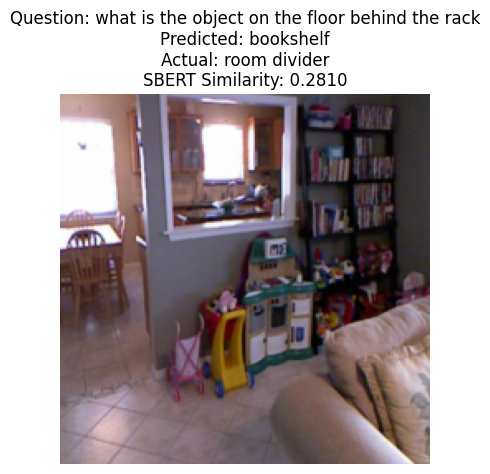

...

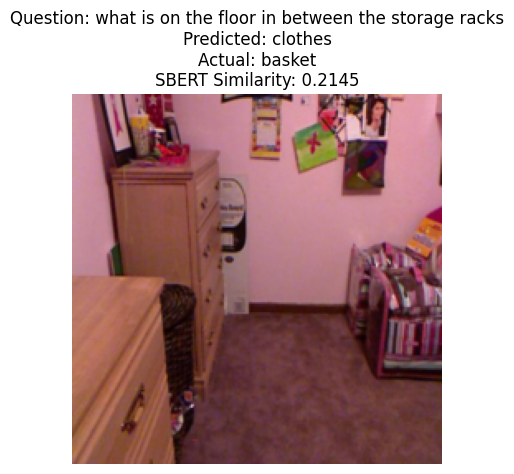

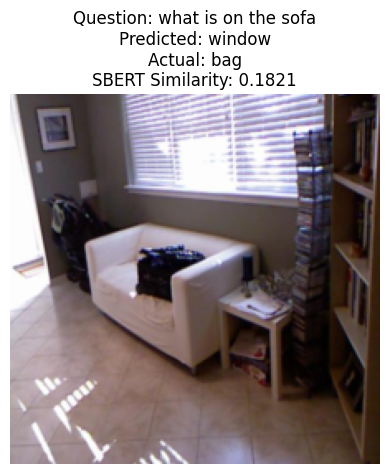

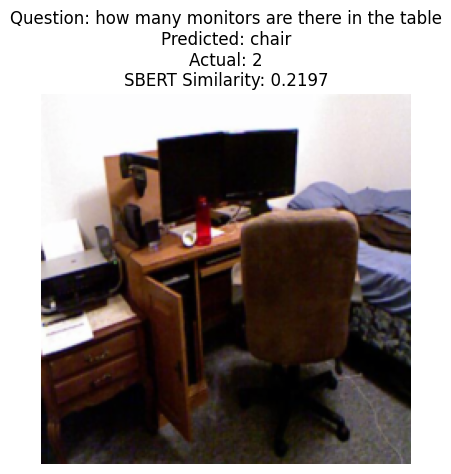

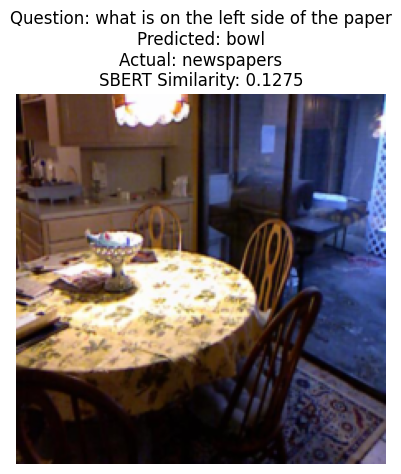

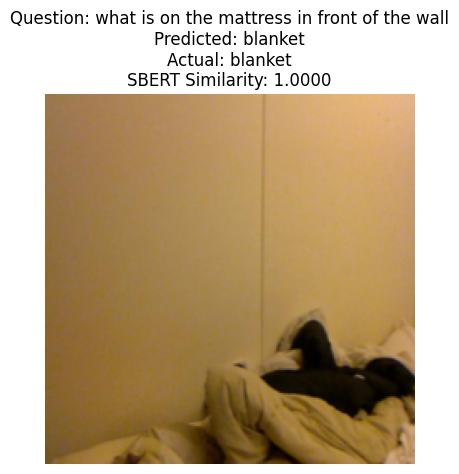

Average SBERT Similarity: 0.3409


In [ ]:
with torch.no_grad():
    for idx, (images, input_ids, attention_mask, labels) in enumerate(test_loader):
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        outputs = model(images, input_ids, attention_mask)
        loss = criterion(outputs, labels)

        test_losses.append(loss.item())

        _, preds = torch.max(outputs, 1)
        accuracy = calculate_accuracy(outputs, labels)
        test_accuracies.append(accuracy)

        predicted_answer = preprocess_answer(answer_space[preds.item()])
        actual_answer = preprocess_answer(answer_space[labels.item()])

        similarity = sbert_similarity(predicted_answer, actual_answer)
        similarities.append(similarity)

        # Plotting the image with question and answers
        image = images.cpu().squeeze().permute(1, 2, 0).numpy()
        image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)

        plt.imshow(image)
        plt.title(f"Question: {test_dataset.data.iloc[idx]['question']}\nPredicted: {predicted_answer}\nActual: {actual_answer}\nSBERT Similarity: {similarity:.4f}")
        plt.axis('off')
        plt.show()

        if idx >= 49:  # Display only 50 samples
            break

# Print average similarity score
average_similarity = np.mean(similarities)
print(f"Average SBERT Similarity: {average_similarity:.4f}")

In [ ]:
!pip install tabulate

In [ ]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tabulate import tabulate

# Load best model
model_path = '/content/best_model.pth'
checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])

# Prepare test data
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Evaluate model
model.eval()
predictions = []
ground_truth = []

with torch.no_grad():
    for images, input_ids, attention_mask, labels in test_loader:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)
        outputs = model(images, input_ids, attention_mask)
        _, preds = torch.max(outputs, 1)
        predictions.extend(preds.cpu().numpy())
        ground_truth.extend(labels.cpu().numpy())

# Calculate performance metrics
accuracy = accuracy_score(ground_truth, predictions)
precision = precision_score(ground_truth, predictions, average='macro')
recall = recall_score(ground_truth, predictions, average='macro')
f1 = f1_score(ground_truth, predictions, average='macro')

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

# Create a DataFrame to display the metrics
metrics = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Score': [accuracy, precision, recall, f1]
}

df = pd.DataFrame(metrics)

# Print the DataFrame in a nice table format
print(tabulate(df, headers='keys', tablefmt='grid', showindex=False))


Accuracy: 0.1595
Precision: 0.0450
Recall: 0.0632
F1 Score: 0.0444
+-----------+-----------+
| Metric    |     Score |
+===========+===========+
| Accuracy  | 0.159515  |
+-----------+-----------+
| Precision | 0.0449753 |
+-----------+-----------+
| Recall    | 0.0631679 |
+-----------+-----------+
| F1 Score  | 0.0443737 |
+-----------+-----------+


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
!pip install statsmodels

Frequency of validation accuracies:
Accuracy 0.0441 appears 1 times
Accuracy 0.0514 appears 1 times
Accuracy 0.0551 appears 1 times
Accuracy 0.0560 appears 1 times
Accuracy 0.0609 appears 1 times
Accuracy 0.0696 appears 1 times
Accuracy 0.0706 appears 1 times
Accuracy 0.0748 appears 1 times
Accuracy 0.0751 appears 1 times
Accuracy 0.0783 appears 1 times
Accuracy 0.0860 appears 1 times
Accuracy 0.0940 appears 1 times
Accuracy 0.0977 appears 1 times
Accuracy 0.1010 appears 1 times
Accuracy 0.1053 appears 1 times
Accuracy 0.1077 appears 1 times
Accuracy 0.1205 appears 1 times
Accuracy 0.1253 appears 1 times
Accuracy 0.1266 appears 1 times
Accuracy 0.1274 appears 1 times
Accuracy 0.1309 appears 1 times
Accuracy 0.1353 appears 1 times
Accuracy 0.1393 appears 1 times
Accuracy 0.1430 appears 1 times
Accuracy 0.1436 appears 1 times
Accuracy 0.1463 appears 1 times
Accuracy 0.1552 appears 1 times
Accuracy 0.1582 appears 1 times
Accuracy 0.1591 appears 1 times
Accuracy 0.1626 appears 1 times
Mean

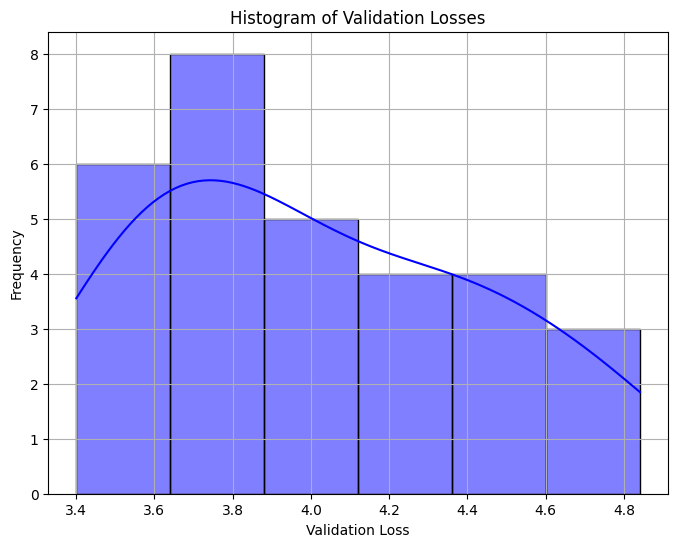

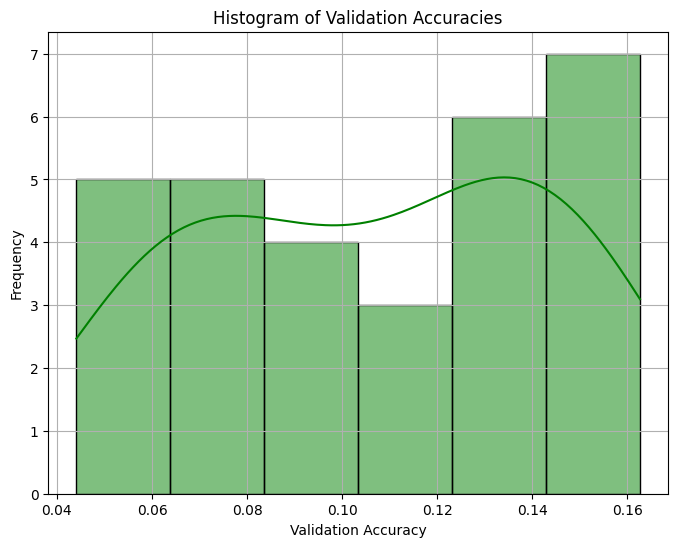

In [ ]:
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.weightstats import ztest
from scipy import stats

# 加载训练数据和验证数据的统计指标
with open("/content/training_metrics.json", "r") as f:
    metrics = json.load(f)

train_losses = np.array(metrics['train_losses'])
val_losses = np.array(metrics['val_losses'])
train_accuracies = np.array(metrics['train_accuracies'])
val_accuracies = np.array(metrics['val_accuracies'])

# 频率分析
print("Frequency of validation accuracies:")
unique, counts = np.unique(val_accuracies, return_counts=True)
for u, c in zip(unique, counts):
    print(f"Accuracy {u:.4f} appears {c} times")

# 均值-方差分析
mean_val_accuracy = np.mean(val_accuracies)
var_val_accuracy = np.var(val_accuracies)
print(f"Mean Validation Accuracy: {mean_val_accuracy:.4f}")
print(f"Variance of Validation Accuracy: {var_val_accuracy:.4f}")

# Z-test (假设总体均值为0.5)
z_score, p_value = ztest(val_accuracies, value=0.5)
print(f"Z-score: {z_score:.16f}, P-value: {p_value:.16f}")

# T-test (比较训练精度和验证精度)
t_score, p_value = stats.ttest_ind(train_accuracies, val_accuracies)
print(f"T-score: {t_score:.16f}, P-value: {p_value:.16f}")

# 卡方检验
chi2_score, p_value = stats.chisquare(counts)
print(f"Chi-square score: {chi2_score:.4f}, P-value: {p_value:.4f}")

# 熵
probabilities = counts / counts.sum()
entropy = stats.entropy(probabilities)
print(f"Entropy: {entropy:.4f}")

# 绘制验证损失的直方图
plt.figure(figsize=(8, 6))
sns.histplot(val_losses, kde=True, color='blue')
plt.title('Histogram of Validation Losses')
plt.xlabel('Validation Loss')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 绘制验证精度的直方图
plt.figure(figsize=(8, 6))
sns.histplot(val_accuracies, kde=True, color='green')
plt.title('Histogram of Validation Accuracies')
plt.xlabel('Validation Accuracy')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
